In [427]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.spatial.distance import cdist

# Load the data from the CSV file into a DataFrame
data = pd.read_csv('simplevqdata.csv', header=None) 

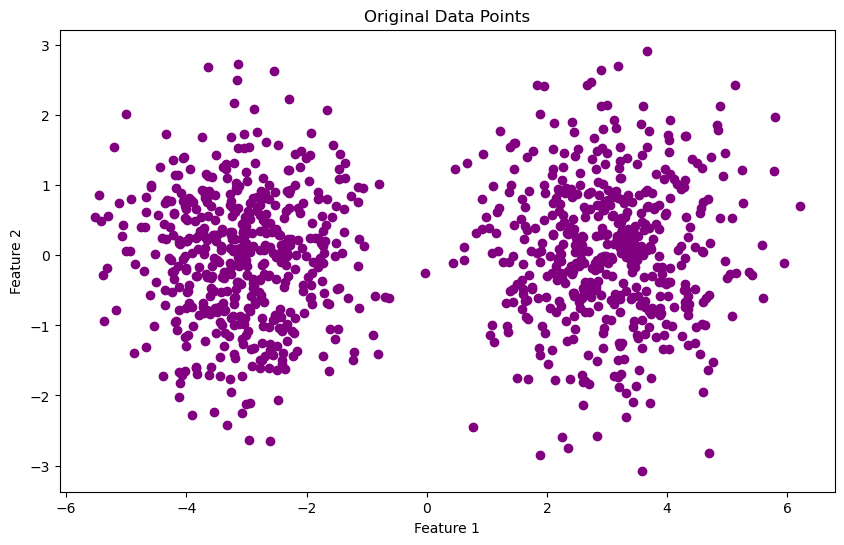

In [428]:
# Visualization of original data points
plt.figure(figsize=(10, 6))
plt.scatter(data[0], data[1], color='purple')
plt.title('Original Data Points')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.show()

In [429]:
csv_file_path = 'simplevqdata.csv'
data = pd.read_csv(csv_file_path, header=None).values

# Determine N (dimension of input vectors)
N = data.shape[1]  

# Determine P (number of examples)
P = data.shape[0]

print('Dimension of input vectors (N):', N)
print('Number of examples (P):', P)

Dimension of input vectors (N): 2
Number of examples (P): 1000


Implementation of VQ training

In [430]:
# Winner-Takes-All unsupervised competitive learning (VQ) implementation

def initialize_prototypes(data, K):
    # Randomly select K data points as prototypes
    indices = np.random.choice(len(data), K, replace=False)
    prototypes = data[indices]
    return prototypes

def calculate_euclidean_distance(data, prototypes):
    # Calculate squared Euclidean distances between data points and prototypes
    distances = np.sum((data[:, np.newaxis] - prototypes) ** 2, axis=2)
    return distances

def update_prototypes(data, prototypes, eta):
    # Find the nearest prototype for each data point
    nearest_prototypes = np.argmin(calculate_euclidean_distance(data, prototypes), axis=1)
    
    # Update prototypes based on the nearest prototype and learning rate
    for i in range(len(prototypes)):
        # Only update the prototype if it is the nearest one to at least one data point
        if np.any(nearest_prototypes == i):
            # Update the prototype using the closest data point
            closest_data_point = data[nearest_prototypes == i][0]  # Take the first closest data point
            prototypes[i] += eta * (closest_data_point - prototypes[i])
    return prototypes

def quantization_error(data, prototypes):
    # Calculate the quantization error (average squared Euclidean distance)
    distances = calculate_euclidean_distance(data, prototypes)
    quantization_error = np.mean(np.min(distances, axis=1))
    return quantization_error

def plot_data_and_prototypes(data, prototypes):
    plt.scatter(data[:, 0], data[:, 1], label='Data points')
    plt.scatter(prototypes[:, 0], prototypes[:, 1], color='red', label='Prototypes')
    plt.xlabel('Dimension 1')
    plt.ylabel('Dimension 2')
    plt.legend()
    plt.title('Epoch {}'.format(t + 1))
    plt.show()

def plot_learning_curve(quantization_errors):
    plt.figure(figsize=(10, 6))
    plt.plot(range(1, len(quantization_errors) + 1), quantization_errors, label='Vector Quantization Error')
    plt.xlabel('Epoch')
    plt.ylabel('Quantization Error (HVQ)')
    plt.title('Quantization Error over Epochs')
    plt.legend()
    plt.grid(True)
    plt.show()

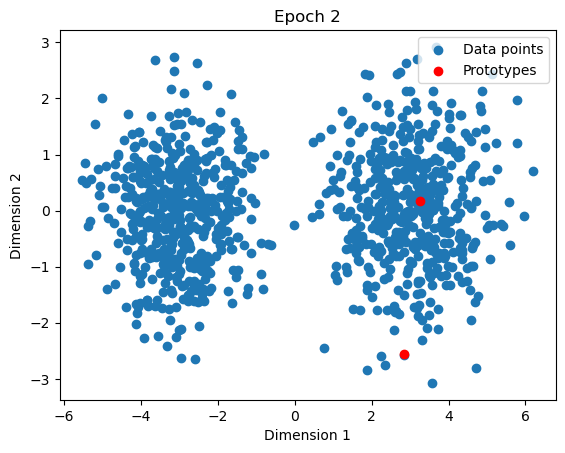

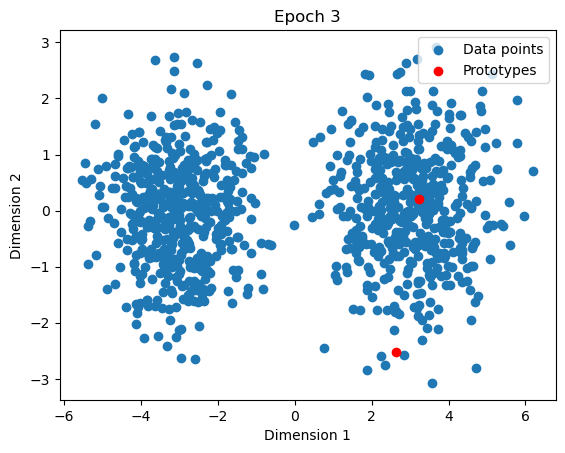

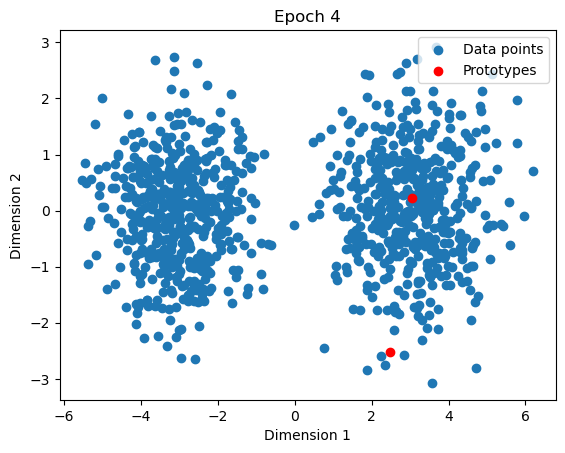

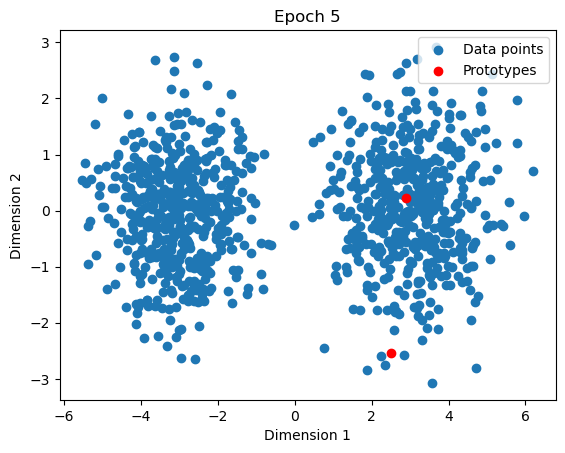

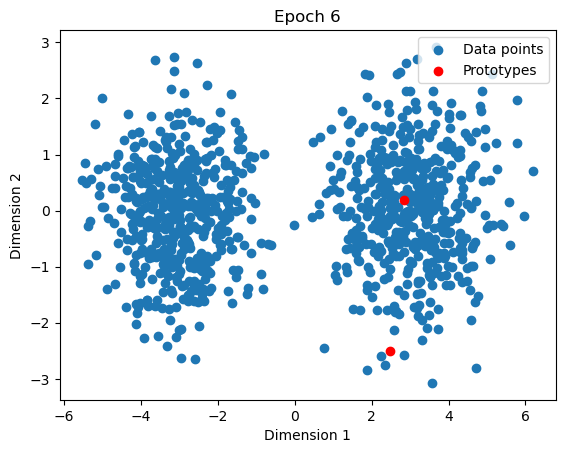

...

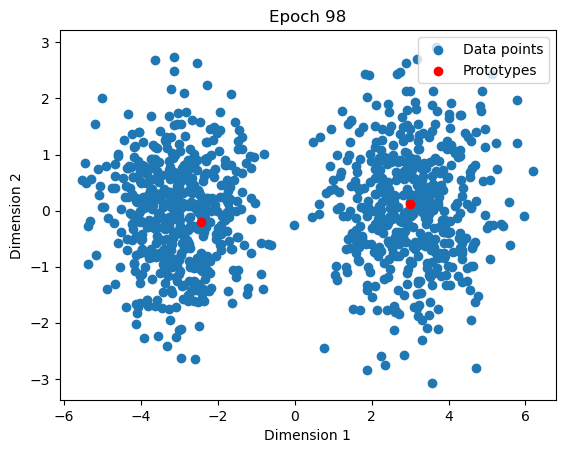

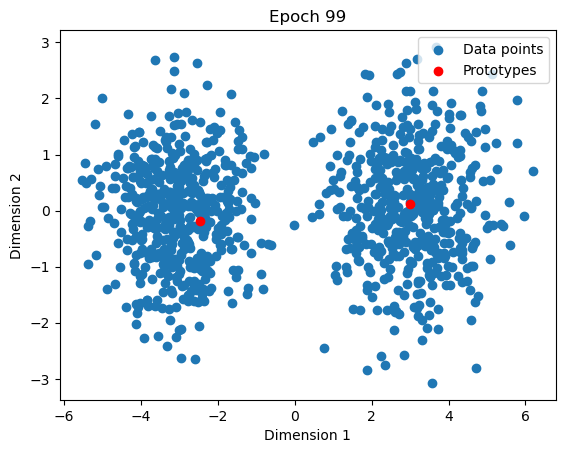

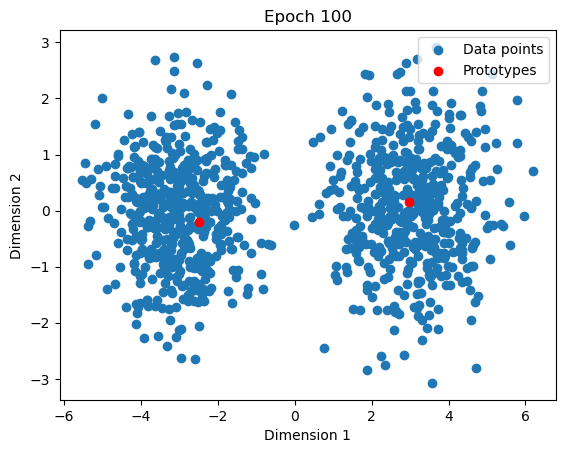

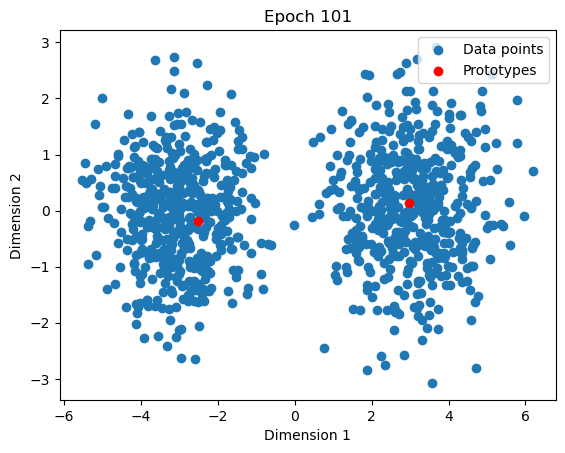

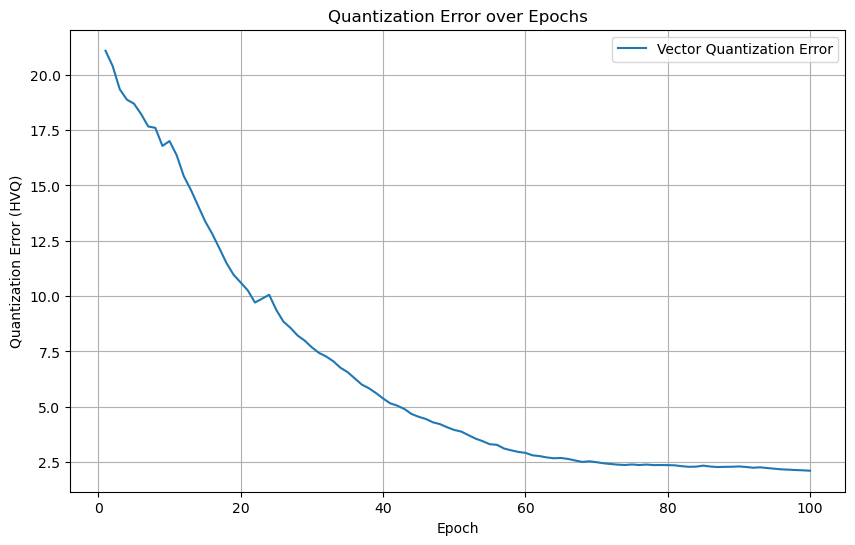

Quantization error for K=2 and η=0.03: 2.1144345039870234


In [431]:
# Set the parameters
K = 2
eta = 0.03
tmax = 100

# Initialize prototypes
prototypes = initialize_prototypes(data, K)

# Train using Winner-Takes-All competitive learning
quantization_errors = []
for t in range(1, tmax + 1):
    # Shuffle the data for this epoch
    permutation_indices = np.random.permutation(P)
    data = data[permutation_indices]
    
    # Update prototypes for each data point
    prototypes = update_prototypes(data, prototypes, eta)
    
    # Calculate and store the quantization error for this epoch
    quantization_error_epoch = quantization_error(data, prototypes)
    quantization_errors.append(quantization_error_epoch)
    
    # Plot the data and prototype positions after each epoch
    plot_data_and_prototypes(data, prototypes)
    
# Plot the learning curve
plot_learning_curve(quantization_errors)

# Display quantization error value for the last epoch
print(f'Quantization error for K={K} and η={eta}: {quantization_errors[-1]}')

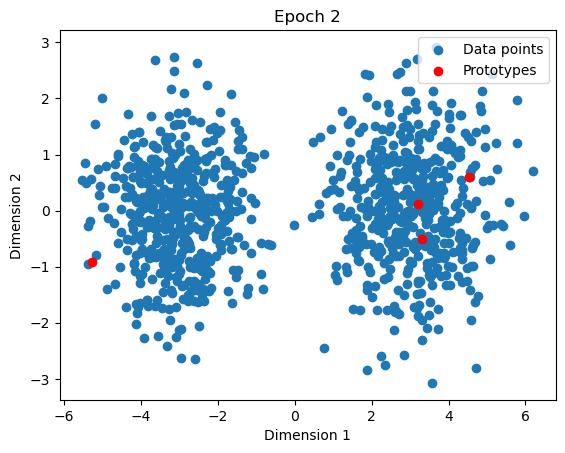

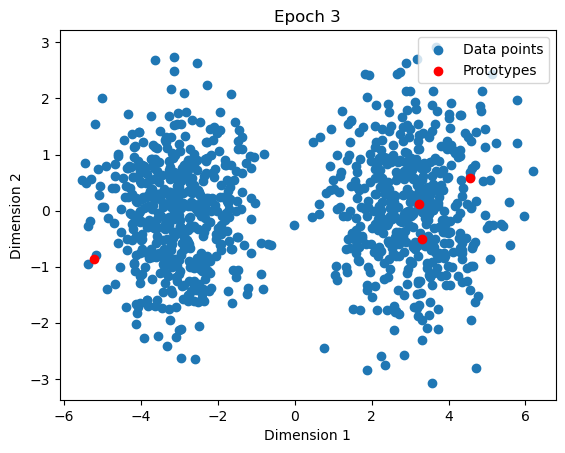

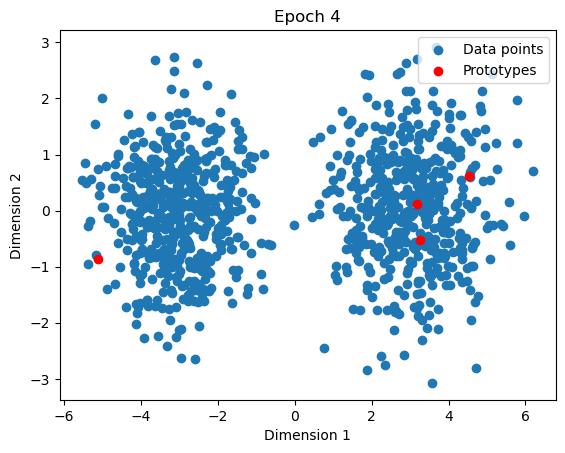

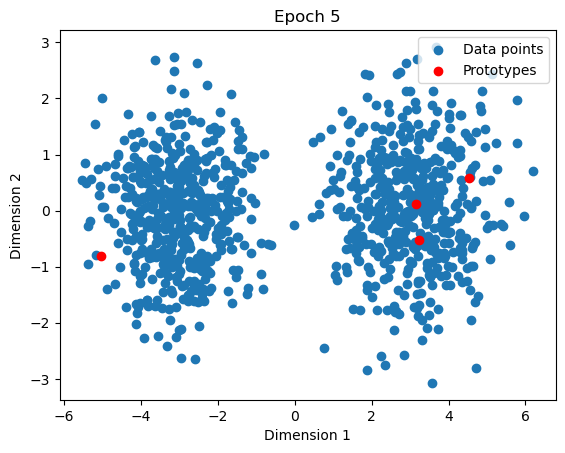

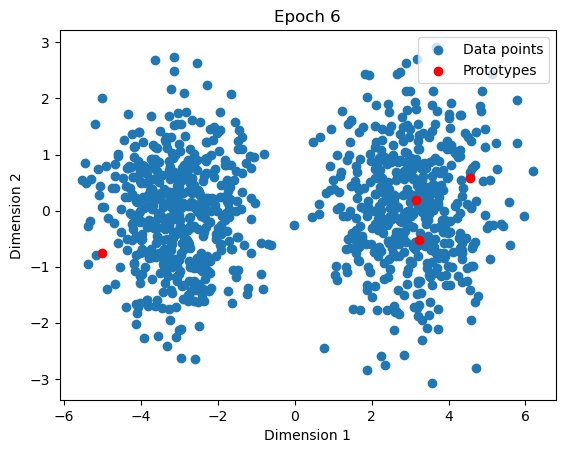

...

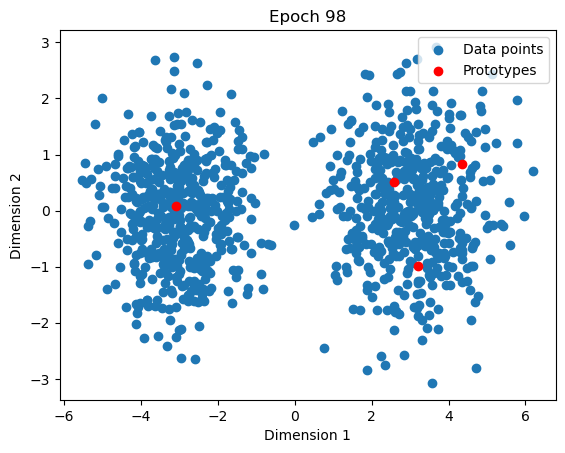

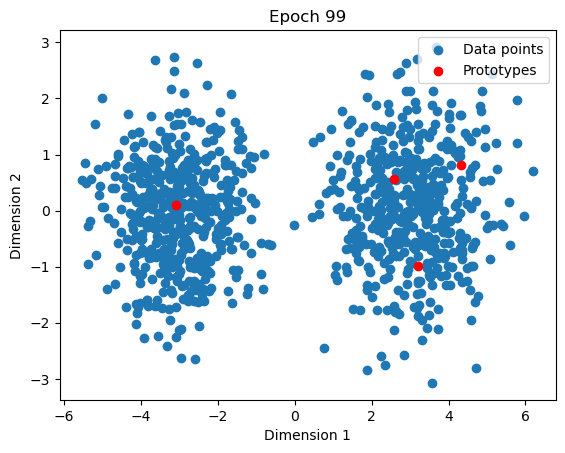

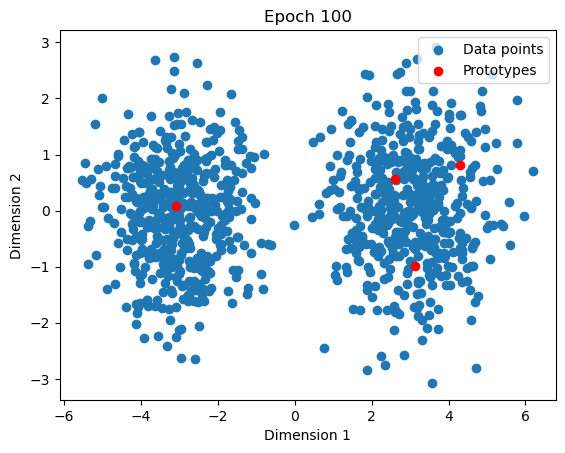

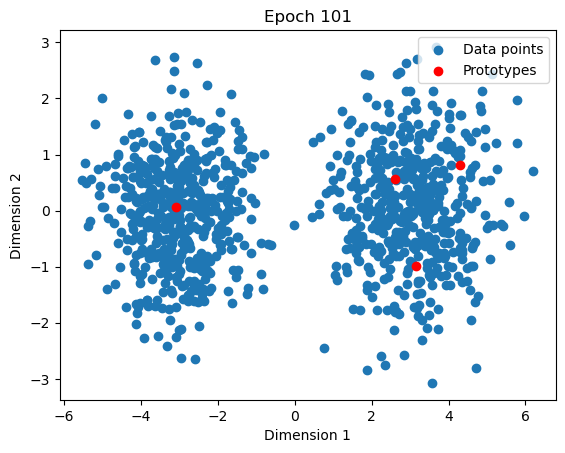

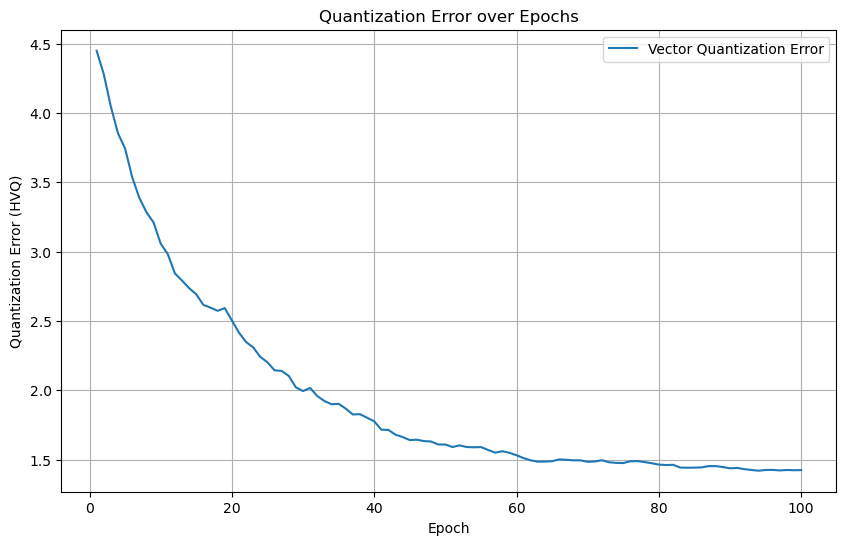

Quantization error for K=4 and η=0.03: 1.4252611632808234


In [432]:
# Set the parameters
K = 4
eta = 0.03
tmax = 100

# Initialize prototypes
prototypes = initialize_prototypes(data, K)

# Train using Winner-Takes-All competitive learning
quantization_errors = []
for t in range(1, tmax + 1):
    # Shuffle the data for this epoch
    permutation_indices = np.random.permutation(P)
    data = data[permutation_indices]
    
    # Update prototypes for each data point
    prototypes = update_prototypes(data, prototypes, eta)
    
    # Calculate and store the quantization error for this epoch
    quantization_error_epoch = quantization_error(data, prototypes)
    quantization_errors.append(quantization_error_epoch)
    
    # Plot the data and prototype positions after each epoch
    plot_data_and_prototypes(data, prototypes)
    
# Plot the learning curve
plot_learning_curve(quantization_errors)

# Display quantization error value for the last epoch
print(f'Quantization error for K={K} and η={eta}: {quantization_errors[-1]}')

The learning curves (HVQ vs. t) for three different values of η for K
= 2 and K = 4, with prototypes initialized in randomly selected data points.

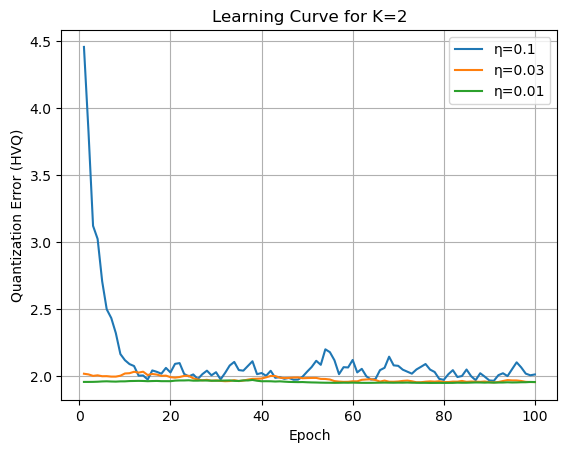

Quantization errors for K=2:
η=0.1: 2.014765352380167
η=0.03: 1.958285068911367
η=0.01: 1.9581277667126142


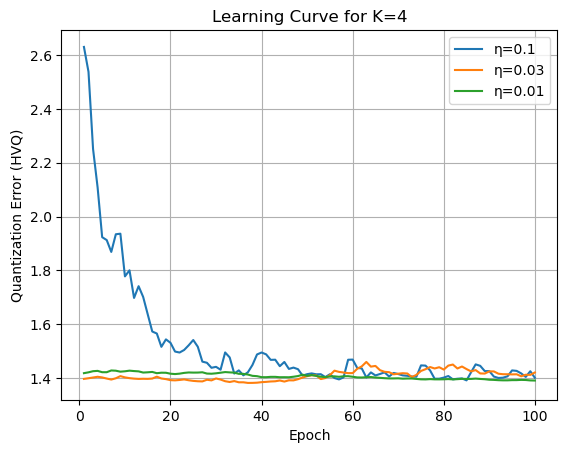

Quantization errors for K=4:
η=0.1: 1.400815369928638
η=0.03: 1.4204871380858677
η=0.01: 1.3905704194146813


In [433]:
# Set the parameters
etas = [0.1, 0.03, 0.01]
K_values = [2, 4]
tmax = 100

# Iterate through different learning rates and K values
for K in K_values:
    # Initialize prototypes for this K
    prototypes = initialize_prototypes(data, K)
    
    # Initialize a list to store quantization errors for this K
    quantization_errors_list = []
    
    for eta in etas:
        # Reset data for each η
        data = data.copy()
        
        # Train using Winner-Takes-All competitive learning
        quantization_errors = []
        for t in range(1, tmax + 1):
            # Shuffle the data for this epoch
            permutation_indices = np.random.permutation(P)
            data = data[permutation_indices]
            
            # Update prototypes for each data point
            prototypes = update_prototypes(data, prototypes, eta)
            
            # Calculate and store the quantization error for this epoch
            quantization_error_epoch = quantization_error(data, prototypes)
            quantization_errors.append(quantization_error_epoch)
        
        # Store the quantization errors for this η
        quantization_errors_list.append(quantization_errors)
        
        # Plot the learning curve for this combination of K and η
        plt.plot(range(1, tmax + 1), quantization_errors, label=f'η={eta}')
    
    plt.xlabel('Epoch')
    plt.ylabel('Quantization Error (HVQ)')
    plt.title(f'Learning Curve for K={K}')
    plt.legend()
    plt.grid(True)
    plt.show()
    
    # Display quantization error values for each η
    print(f'Quantization errors for K={K}:')
    for i, eta in enumerate(etas):
        print(f'η={eta}: {quantization_errors_list[i][-1]}')


Plots displaying the trajectories of prototypes in the course of learning for K = 4, showing the trace of the prototypes from initial to final position
together with the data points. Choose a learning rate that gives non-trivial,
mean-ingful results. Perform the training from at least two different
intializations (one of them in randomly selected data points, one of them
”stupid”)

Training with random initialization


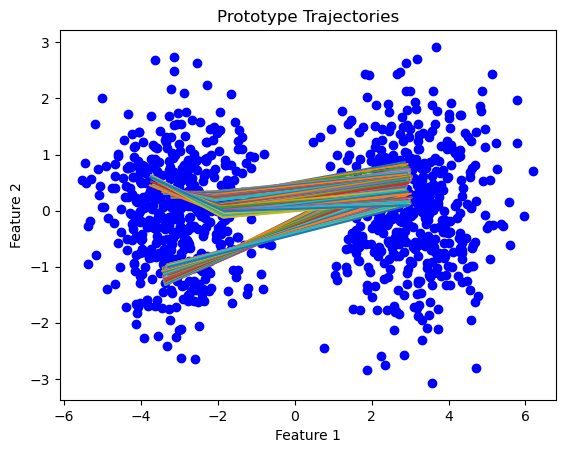

Training with stupid initialization


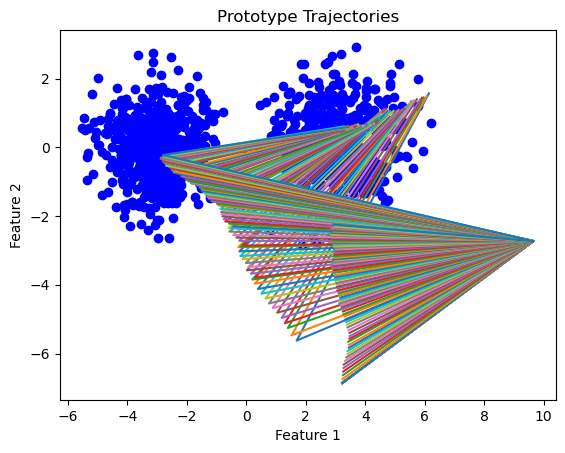

In [434]:
K = 4
eta = 0.03
tmax = 100

# Define a function to initialize prototypes "stupidly" (far from data points)
def initialize_prototypes_stupid(data, K):
    # Calculate the mean and standard deviation of the data points
    data_mean = np.mean(data, axis=0)
    data_std = np.std(data, axis=0)
    
    # Initialize prototypes reasonably far from the data mean
    prototypes = np.tile(data_mean, (K, 1)) + 3 * data_std * np.random.randn(K, data.shape[1])
    
    return prototypes

def train_and_plot_trajectories(data, K, eta, tmax, initialization_method):
    # Initialize prototypes
    if initialization_method == 'random':
        prototypes = initialize_prototypes(data, K)
    elif initialization_method == 'stupid':
        prototypes = initialize_prototypes_stupid(data, K)
    
    # Store prototype positions at each epoch
    prototype_trajectories = [prototypes.copy()]
    
    # Train using Winner-Takes-All competitive learning
    quantization_errors = []
    for t in range(1, tmax + 1):
        # Shuffle the data for this epoch
        permutation_indices = np.random.permutation(P)
        shuffled_data = data[permutation_indices]
        
        # Update prototypes for each data point
        prototypes = update_prototypes(shuffled_data, prototypes, eta)
        
        # Calculate and store the quantization error for this epoch
        quantization_error_epoch = quantization_error(shuffled_data, prototypes)
        quantization_errors.append(quantization_error_epoch)
        
        # Store the current prototype positions
        prototype_trajectories.append(prototypes.copy())
    
    # Plot the data and prototype positions after training
    plot_data_and_prototype_trajectories(data, prototype_trajectories)

# Perform training with random initialization
print("Training with random initialization")
train_and_plot_trajectories(data, K, eta, tmax, 'random')

# Perform training with stupid initialization
print("Training with stupid initialization")
train_and_plot_trajectories(data, K, eta, tmax, 'stupid')

BONUS

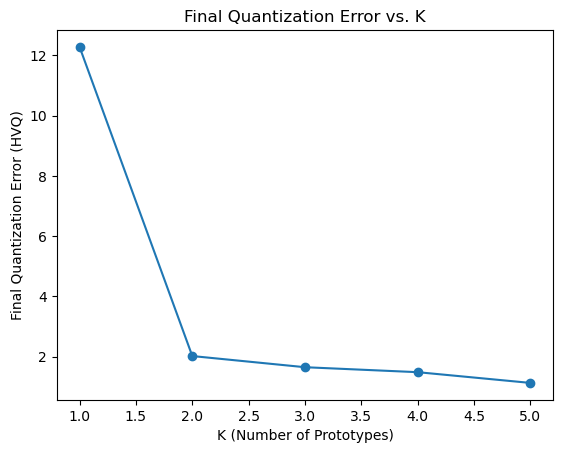

In [435]:
# Perform experiments for different values of K
K_values = [1, 2, 3, 4, 5]
final_quantization_errors = []

for K in K_values:
    # Initialize prototypes
    prototypes = initialize_prototypes(data, K)
    
    # Train using Winner-Takes-All competitive learning
    quantization_errors = []
    for t in range(1, tmax + 1):
        # Shuffle the data for this epoch
        permutation_indices = np.random.permutation(P)
        data = data[permutation_indices]
        
        # Update prototypes for each data point
        prototypes = update_prototypes(data, prototypes, eta)
        
        # Calculate and store the quantization error for this epoch
        quantization_error_epoch = quantization_error(data, prototypes)
        quantization_errors.append(quantization_error_epoch)
    
    # Record the final quantization error for this K value
    final_quantization_errors.append(quantization_errors[-1])

# Plot the final quantization error as a function of K
plt.plot(K_values, final_quantization_errors, marker='o')
plt.xlabel('K (Number of Prototypes)')
plt.ylabel('Final Quantization Error (HVQ)')
plt.title('Final Quantization Error vs. K')
plt.show()
